In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
import os
for dirname, _, filenames in os.walk('./'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

./basicPythonBenchmark.zip
./test.csv
./randomBenchmark.zip
./data.zip
./train.csv
./testOrderBenchmark.zip
./Day4.ipynb
./.ipynb_checkpoints/Day4-checkpoint.ipynb


In [3]:
# Unzipping the data files
#!unzip ./data.zip

In [4]:
expedia_data=pd.read_csv("./train.csv")

In [5]:
expedia_data.describe()

,srch_id,site_id,visitor_location_country_id,visitor_hist_starrating,visitor_hist_adr_usd,prop_country_id,prop_id,prop_starrating,prop_review_score,prop_brand_bool,...,comp6_rate_percent_diff,comp7_rate,comp7_inv,comp7_rate_percent_diff,comp8_rate,comp8_inv,comp8_rate_percent_diff,click_bool,gross_bookings_usd,booking_bool
count,9.917530e+06,9.917530e+06,9.917530e+06,505297.000000,507612.000000,9.917530e+06,9.917530e+06,9.917530e+06,9.902900e+06,9.917530e+06,...,1.933120e+05,631077.000000,713175.000000,277838.000000,3.819043e+06,3.960388e+06,1.225707e+06,9.917530e+06,276592.000000,9.917530e+06
mean,3.329138e+05,9.966175e+00,1.752954e+02,3.374634,176.588512,1.739055e+02,7.008015e+04,3.181534e+00,3.777702e+00,6.343042e-01,...,2.301390e+01,0.147061,0.082259,20.141888,-6.072490e-02,9.889435e-03,2.321000e+01,4.473614e-02,386.530099,2.788930e-02
std,1.922876e+05,7.657325e+00,6.590955e+01,0.692218,108.434842,6.834768e+01,4.061177e+04,1.050191e+00,1.050806e+00,4.816248e-01,...,2.560429e+03,0.578748,0.316165,136.217976,4.692456e-01,2.031648e-01,9.462088e+02,2.067240e-01,801.073164,1.646557e-01
min,1.000000e+00,1.000000e+00,1.000000e+00,1.000000,0.000000,1.000000e+00,1.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,2.000000e+00,-1.000000,-1.000000,2.000000,-1.000000e+00,-1.000000e+00,2.000000e+00,0.000000e+00,0.000000,0.000000e+00
25%,1.665160e+05,5.000000e+00,1.000000e+02,2.920000,110.330000,1.000000e+02,3.501000e+04,3.000000e+00,3.500000e+00,0.000000e+00,...,6.000000e+00,0.000000,0.000000,7.000000,0.000000e+00,0.000000e+00,7.000000e+00,0.000000e+00,124.240000,0.000000e+00
50%,3.328140e+05,5.000000e+00,2.190000e+02,3.440000,151.830000,2.190000e+02,6.961500e+04,3.000000e+00,4.000000e+00,1.000000e+00,...,1.100000e+01,0.000000,0.000000,12.000000,0.000000e+00,0.000000e+00,1.100000e+01,0.000000e+00,219.420000,0.000000e+00
75%,4.999000e+05,1.400000e+01,2.190000e+02,3.940000,214.350000,2.190000e+02,1.051770e+05,4.000000e+00,4.500000e+00,1.000000e+00,...,1.800000e+01,1.000000,0.000000,20.000000,0.000000e+00,0.000000e+00,1.700000e+01,0.000000e+00,431.760000,0.000000e+00
max,6.655740e+05,3.400000e+01,2.310000e+02,5.000000,2768.930000,2.300000e+02,1.408210e+05,5.000000e+00,5.000000e+00,1.000000e+00,...,1.125686e+06,1.000000,1.000000,30216.000000,1.000000e+00,1.000000e+00,1.494000e+05,1.000000e+00,167740.590000,1.000000e+00


In [6]:
expedia_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9917530 entries, 0 to 9917529
Data columns (total 54 columns):
srch_id                        int64
date_time                      object
site_id                        int64
visitor_location_country_id    int64
visitor_hist_starrating        float64
visitor_hist_adr_usd           float64
prop_country_id                int64
prop_id                        int64
prop_starrating                int64
prop_review_score              float64
prop_brand_bool                int64
prop_location_score1           float64
prop_location_score2           float64
prop_log_historical_price      float64
position                       int64
price_usd                      float64
promotion_flag                 int64
srch_destination_id            int64
srch_length_of_stay            int64
srch_booking_window            int64
srch_adults_count              int64
srch_children_count            int64
srch_room_count                int64
srch_saturday_night_b

In [7]:
expedia_data.isnull().sum().sort_values(ascending=False).index

Index(['comp1_rate_percent_diff', 'comp6_rate_percent_diff', 'comp1_rate',
       'comp1_inv', 'comp4_rate_percent_diff', 'gross_bookings_usd',
       'comp7_rate_percent_diff', 'comp6_rate', 'visitor_hist_starrating',
       'visitor_hist_adr_usd', 'comp6_inv', 'comp4_rate', 'comp7_rate',
       'srch_query_affinity_score', 'comp4_inv', 'comp7_inv',
       'comp3_rate_percent_diff', 'comp2_rate_percent_diff',
       'comp8_rate_percent_diff', 'comp5_rate_percent_diff', 'comp3_rate',
       'comp3_inv', 'comp8_rate', 'comp8_inv', 'comp2_rate', 'comp2_inv',
       'comp5_rate', 'comp5_inv', 'orig_destination_distance',
       'prop_location_score2', 'prop_review_score', 'prop_id',
       'prop_starrating', 'prop_brand_bool', 'booking_bool', 'prop_country_id',
       'visitor_location_country_id', 'site_id', 'date_time',
       'prop_location_score1', 'random_bool', 'prop_log_historical_price',
       'position', 'price_usd', 'promotion_flag', 'srch_destination_id',
       'srch_length_o

In [ ]:
null_data = ['comp1_rate_percent_diff', 'comp6_rate_percent_diff', 'comp1_rate',
       'comp1_inv', 'comp4_rate_percent_diff', 'comp7_rate_percent_diff',
       'comp6_rate', 'comp6_inv', 'comp4_rate', 'comp7_rate', 'srch_query_affinity_score',
       'comp4_inv', 'comp7_inv', 'comp3_rate_percent_diff',
       'comp2_rate_percent_diff', 'comp8_rate_percent_diff',
       'comp5_rate_percent_diff', 'comp3_rate', 'comp3_inv', 'comp8_rate',
       'comp8_inv', 'comp2_rate', 'comp2_inv', 'comp5_rate', 'comp5_inv','srch_id']

In [9]:
expedia_data=expedia_data.drop(null_data,axis=1)

In [10]:
expedia_data.isnull().sum()

site_id                              0
visitor_location_country_id          0
visitor_hist_starrating        9412233
visitor_hist_adr_usd           9409918
prop_country_id                      0
prop_id                              0
prop_starrating                      0
prop_review_score                14630
prop_brand_bool                      0
prop_location_score1                 0
prop_location_score2           2178380
prop_log_historical_price            0
position                             0
price_usd                            0
promotion_flag                       0
srch_destination_id                  0
srch_length_of_stay                  0
srch_booking_window                  0
srch_adults_count                    0
srch_children_count                  0
srch_room_count                      0
srch_saturday_night_bool             0
orig_destination_distance      3216461
random_bool                          0
click_bool                           0
gross_bookings_usd       

In [11]:
expedia_data.head()

,site_id,visitor_location_country_id,visitor_hist_starrating,visitor_hist_adr_usd,prop_country_id,prop_id,prop_starrating,prop_review_score,prop_brand_bool,prop_location_score1,...,srch_booking_window,srch_adults_count,srch_children_count,srch_room_count,srch_saturday_night_bool,orig_destination_distance,random_bool,click_bool,gross_bookings_usd,booking_bool
0,12,187,NaN,NaN,219,893,3,3.5,1,2.83,...,0,4,0,1,1,NaN,1,0,NaN,0
1,12,187,NaN,NaN,219,10404,4,4.0,1,2.20,...,0,4,0,1,1,NaN,1,0,NaN,0
2,12,187,NaN,NaN,219,21315,3,4.5,1,2.20,...,0,4,0,1,1,NaN,1,0,NaN,0
3,12,187,NaN,NaN,219,27348,2,4.0,1,2.83,...,0,4,0,1,1,NaN,1,0,NaN,0
4,12,187,NaN,NaN,219,29604,4,3.5,1,2.64,...,0,4,0,1,1,NaN,1,0,NaN,0


In [12]:
#dropping columns with NAN values
expedia_data.dropna(inplace=True)

In [13]:
expedia_data.head()

,site_id,visitor_location_country_id,visitor_hist_starrating,visitor_hist_adr_usd,prop_country_id,prop_id,prop_starrating,prop_review_score,prop_brand_bool,prop_location_score1,...,srch_booking_window,srch_adults_count,srch_children_count,srch_room_count,srch_saturday_night_bool,orig_destination_distance,random_bool,click_bool,gross_bookings_usd,booking_bool
568,14,100,4.31,180.75,137,77040,4,4.0,0,3.14,...,3,1,1,1,0,5593.11,0,1,924.00,1
586,16,31,2.50,270.08,31,13962,4,4.5,1,6.42,...,5,2,0,1,0,144.11,0,1,128.48,1
1082,5,219,2.50,122.34,219,107761,4,3.5,1,2.64,...,24,1,0,1,0,386.87,0,1,324.08,1
1206,16,31,3.74,210.60,31,33406,4,4.0,1,0.69,...,3,1,0,1,1,166.25,0,1,96.90,1
3196,32,55,5.00,185.91,129,19663,4,4.5,0,1.61,...,0,1,1,2,0,528.35,1,1,141.69,1


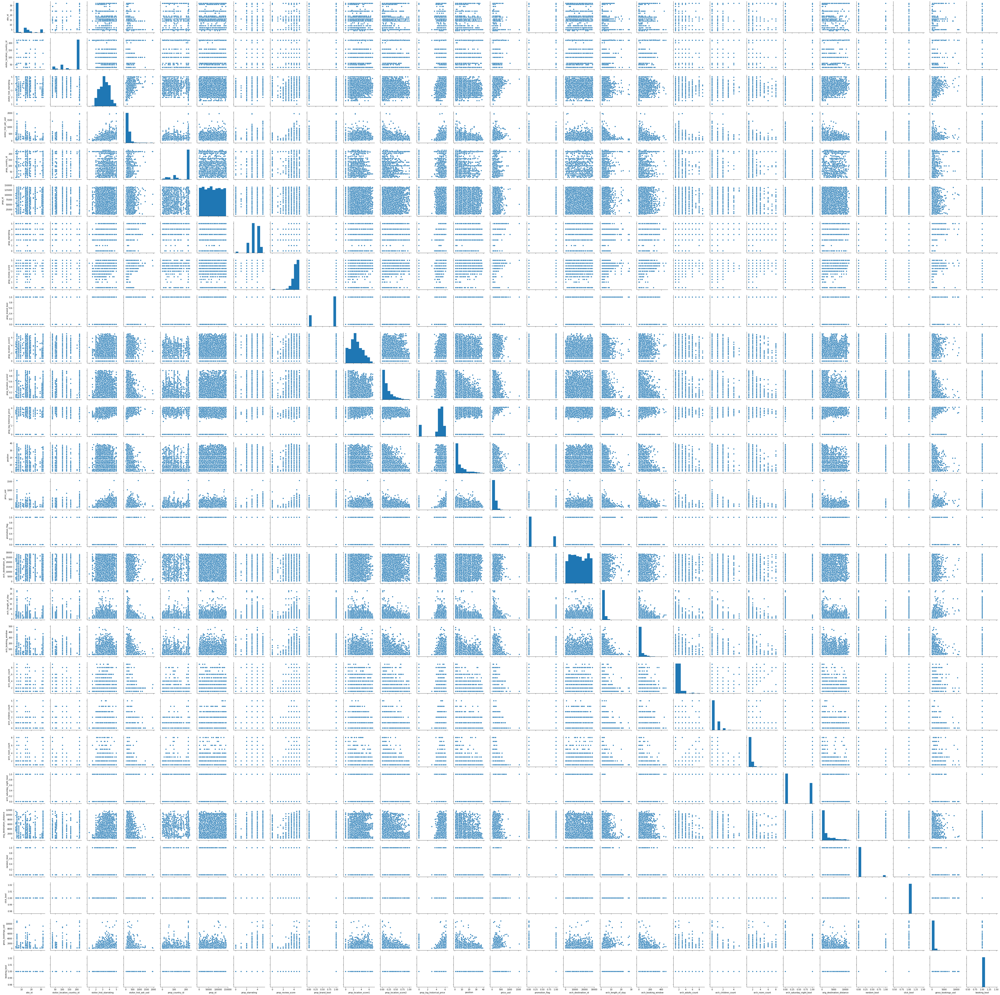

In [14]:
sns.pairplot(expedia_data)

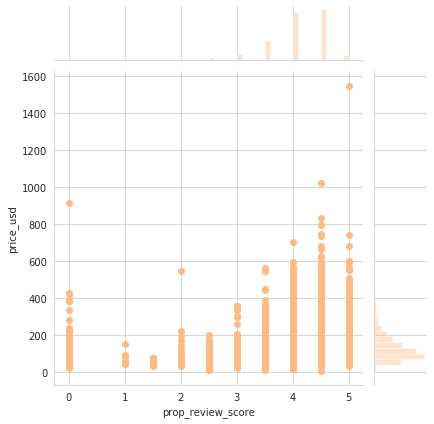

In [37]:
#sns.set_palette("magma_r")
#sns.set_style('whitegrid')
sns.jointplot(x='prop_review_score',y='price_usd',data=expedia_data)

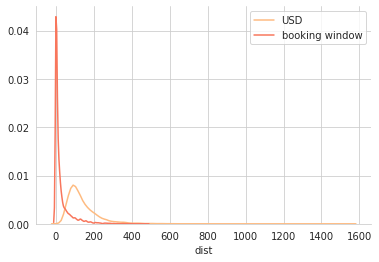

In [38]:
sns.distplot(expedia_data['price_usd'], 
                 hist = False, label = 'USD')

sns.distplot(expedia_data['srch_booking_window'], 
                  hist = False, label = 'booking window')

plt.xlabel('dist')
sns.despine()

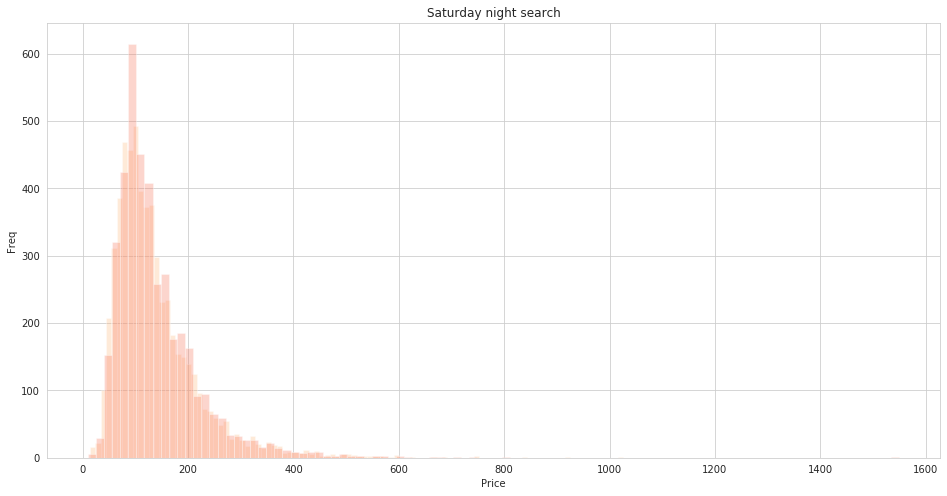

In [54]:
plt.figure(figsize = (16, 8))

plt.hist(expedia_data.loc[expedia_data['srch_saturday_night_bool']==0,'price_usd'], bins = 100, 
         alpha = 0.3, 
         label = 'search without Saturday night stay')

plt.hist(expedia_data.loc[expedia_data['srch_saturday_night_bool']==1,'price_usd'], bins = 100, 
         alpha = 0.3, 
         label = 'search with Saturday night stay')

plt.xlabel('Price')
plt.ylabel('Freq')
plt.title('Saturday night search')
plt.plot();

In [44]:
from sklearn.decomposition import PCA
pca = PCA(n_components=2,copy=False)

In [45]:
pca_op = pca.fit_transform(expedia_data)

In [46]:
pca.explained_variance_ratio_.sum()

0.9964436016139885

In [47]:
pca_op.shape

(9882, 2)

In [48]:
final_data = pd.DataFrame(data=pca_op,columns=["Principal_Component_1","Principal_Component_2"])

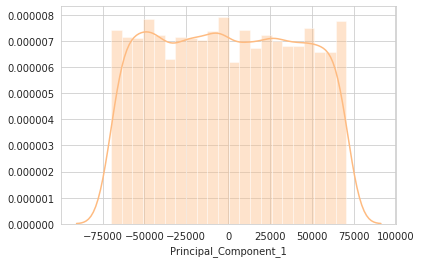

In [51]:
sns.distplot(final_data['Principal_Component_1'])

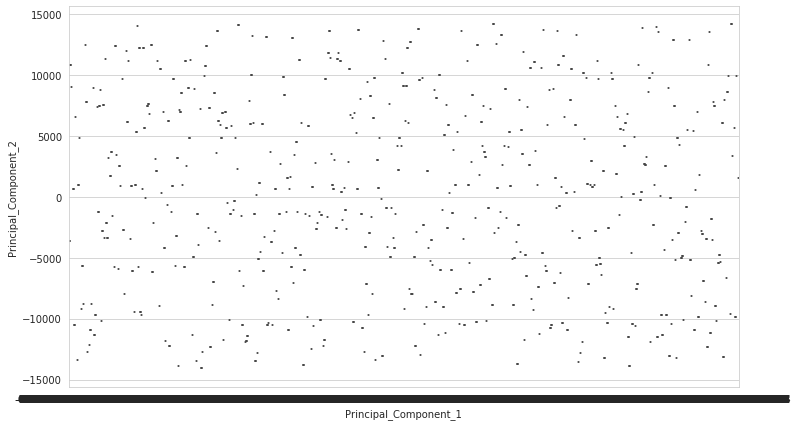

In [58]:
plt.figure(figsize=(12, 7))
sns.boxplot(x='Principal_Component_1',y='Principal_Component_2',data=final_data,palette='rainbow_r')

In [59]:
from sklearn.cluster import KMeans
kmean_data = expedia_data[['price_usd', 'srch_booking_window', 'srch_saturday_night_bool']]
n_cluster = range(1, 25)

kmeans = [KMeans(n_clusters = i).fit(kmean_data) for i in n_cluster]
scores = [kmeans[i].score(kmean_data) for i in range(len(kmeans))]

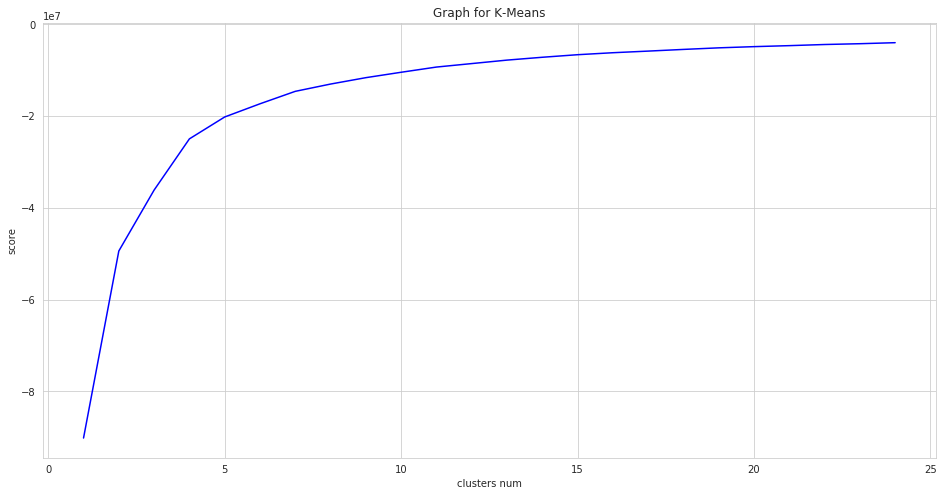

In [60]:
fig, ax = plt.subplots(figsize = (16, 8))
ax.plot(n_cluster, scores, color = 'blue')

plt.xlabel('clusters num')
plt.ylabel('score')
plt.title('Graph for K-Means')
plt.show()

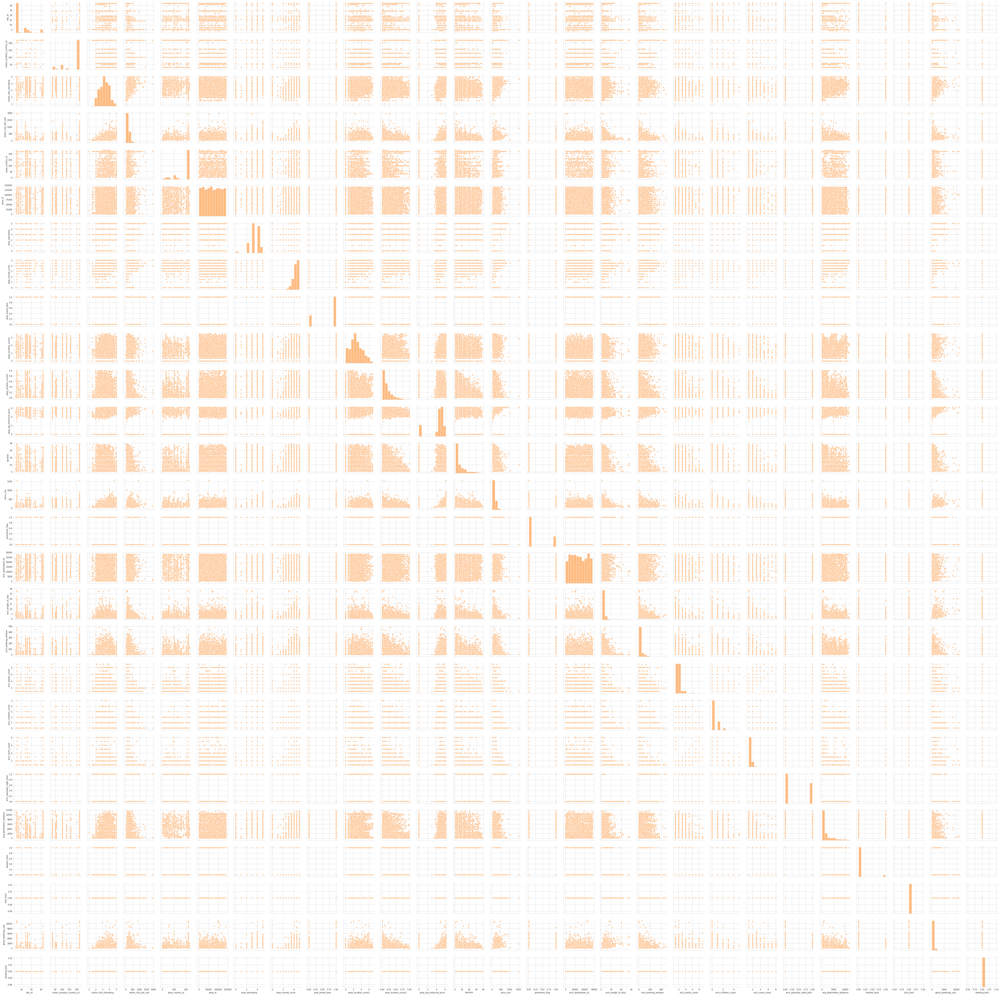

In [61]:
sns.pairplot(expedia_data)

In [ ]:
sns.pairplot(kmean_data)